In [33]:
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

In [38]:
# !wget https://data.mendeley.com/datasets/rscbjbr9sj/3/files/810b2ce2-11c3-4424-996e-3bef36600907/ZhangLabData.zip
# !unzip /content/ZhangLabData.zip
dataroot = '/kaggle/input/ct-kidney-dataset-normal-cyst-tumor-and-stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/Normal'


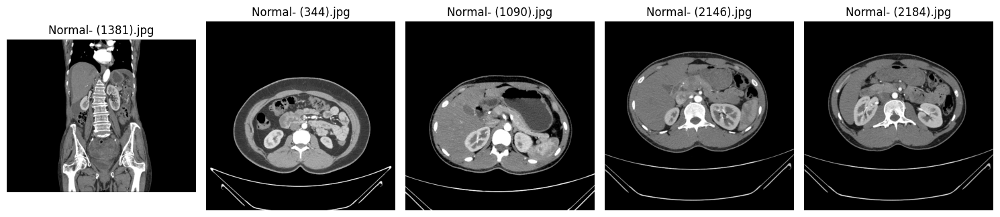

In [39]:
import cv2

image_list = os.listdir(dataroot)

# Set the number of images to display
num_images = 5

# Create a figure for displaying images
plt.figure(figsize=(15, 5))

# Loop through the first `num_images` images
for i in range(num_images):
    img_path = os.path.join(dataroot, image_list[i])  # Construct full image path
    img = cv2.imread(img_path)  # Read the image
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for proper color display
    plt.subplot(1, num_images, i + 1)  # Create subplots
    plt.imshow(img)  # Display the image
    plt.axis('off')  # Hide the axis
    plt.title(image_list[i])  # Set the title to the image file name

plt.tight_layout()  # Adjust the layout
plt.show()  # Show the plot

In [42]:
workers = 4
batch_size = 128
image_size = 64
nc = 3
nz = 100
ngf = 64
ndf = 64
num_epochs = 5
lr = 0.0002
beta1 = 0.5
ngpu = 1

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


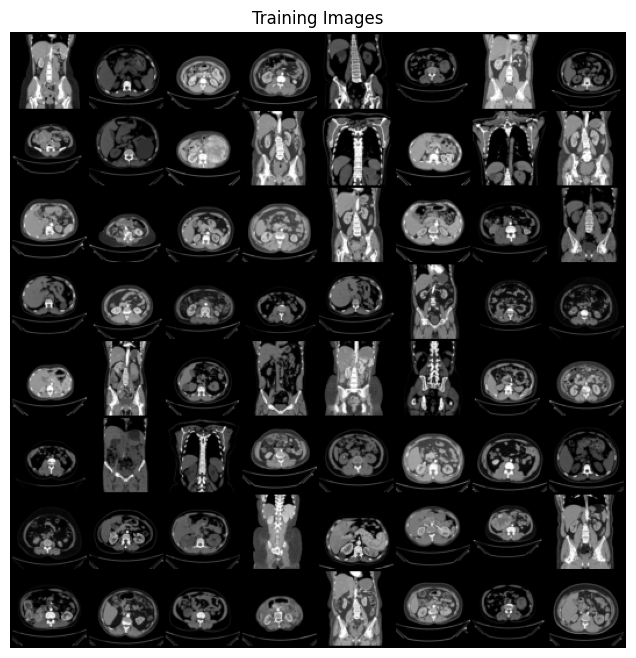

In [44]:
dataroot = '/kaggle/input/ct-kidney-dataset-normal-cyst-tumor-and-stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone'

dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5), (0.5)),
                           ]))
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [45]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [46]:
def build_generator(ngpu):
    layers = []

    layers.append(nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False))
    layers.append(nn.BatchNorm2d(ngf * 8))
    layers.append(nn.ReLU(True))

    layers.append(nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False))
    layers.append(nn.BatchNorm2d(ngf * 4))
    layers.append(nn.ReLU(True))

    layers.append(nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False))
    layers.append(nn.BatchNorm2d(ngf * 2))
    layers.append(nn.ReLU(True))

    layers.append(nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False))
    layers.append(nn.BatchNorm2d(ngf))
    layers.append(nn.ReLU(True))

    layers.append(nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False))
    layers.append(nn.Tanh())

    model = nn.Sequential(*layers)

    return model

generator = build_generator(ngpu)

generator

Sequential(
  (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): ReLU(inplace=True)
  (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (8): ReLU(inplace=True)
  (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (11): ReLU(inplace=True)
  (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (13): Tanh()
)

In [47]:
netG = build_generator(ngpu).to(device)

if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

netG.apply(weights_init)

netG

Sequential(
  (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): ReLU(inplace=True)
  (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (8): ReLU(inplace=True)
  (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (11): ReLU(inplace=True)
  (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (13): Tanh()
)

In [48]:
def build_discriminator(ngpu):
    layers = []

    layers.append(nn.Conv2d(nc, ndf, 4, 2, 1, bias=False))  # Input is (nc) x 64 x 64
    layers.append(nn.LeakyReLU(0.2, inplace=True))

    layers.append(nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False))  # State size (ndf) x 32 x 32
    layers.append(nn.BatchNorm2d(ndf * 2))
    layers.append(nn.LeakyReLU(0.2, inplace=True))

    layers.append(nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False))  # State size (ndf*2) x 16 x 16
    layers.append(nn.BatchNorm2d(ndf * 4))
    layers.append(nn.LeakyReLU(0.2, inplace=True))

    layers.append(nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False))  # State size (ndf*4) x 8 x 8
    layers.append(nn.BatchNorm2d(ndf * 8))
    layers.append(nn.LeakyReLU(0.2, inplace=True))

    layers.append(nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False))  # State size (ndf*8) x 4 x 4
    layers.append(nn.Sigmoid())  # Output layer

    model = nn.Sequential(*layers)

    return model

discriminator = build_discriminator(ngpu)

discriminator

Sequential(
  (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (1): LeakyReLU(negative_slope=0.2, inplace=True)
  (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (4): LeakyReLU(negative_slope=0.2, inplace=True)
  (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (7): LeakyReLU(negative_slope=0.2, inplace=True)
  (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (10): LeakyReLU(negative_slope=0.2, inplace=True)
  (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (12): Sigmoid()
)

In [49]:
netD = build_discriminator(ngpu).to(device)

if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

netD.apply(weights_init)
netD

Sequential(
  (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (1): LeakyReLU(negative_slope=0.2, inplace=True)
  (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (4): LeakyReLU(negative_slope=0.2, inplace=True)
  (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (7): LeakyReLU(negative_slope=0.2, inplace=True)
  (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (10): LeakyReLU(negative_slope=0.2, inplace=True)
  (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (12): Sigmoid()
)

In [50]:
criterion = nn.BCELoss()

fixed_noise = torch.randn(64, nz, 1, 1, device=device)

real_label = 1
fake_label = 0

optimizerD = optim.Adam(netD.parameters(), lr=0.0002, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=0.001, betas=(beta1, 0.999))

In [51]:
img_list = []
G_losses = []
D_losses = []
iters = 0
num_epochs = 35

print("Starting Training Loop...")
for epoch in range(num_epochs):
    for i, data in enumerate(dataloader, 0):

        netD.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device).float()  # Convert to Float
        output = netD(real_cpu).view(-1) # 256??
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        noise = torch.randn(b_size, nz, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(fake_label)
        output = netD(fake.detach()).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        output = netD(fake).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        G_losses.append(errG.item())
        D_losses.append(errD.item())

        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Starting Training Loop...
[0/35][0/98]	Loss_D: 1.4105	Loss_G: 2.9050	D(x): 0.4498	D(G(z)): 0.3166 / 0.0738
[0/35][50/98]	Loss_D: 2.0429	Loss_G: 4.1993	D(x): 0.5733	D(G(z)): 0.6203 / 0.0268
[1/35][0/98]	Loss_D: 1.4053	Loss_G: 1.9669	D(x): 0.5430	D(G(z)): 0.4901 / 0.1786
[1/35][50/98]	Loss_D: 1.4952	Loss_G: 1.5196	D(x): 0.5660	D(G(z)): 0.5726 / 0.2399
[2/35][0/98]	Loss_D: 1.6050	Loss_G: 1.0434	D(x): 0.4299	D(G(z)): 0.4585 / 0.3728
[2/35][50/98]	Loss_D: 1.3078	Loss_G: 0.8421	D(x): 0.4520	D(G(z)): 0.3609 / 0.4477
[3/35][0/98]	Loss_D: 1.3596	Loss_G: 1.6574	D(x): 0.6387	D(G(z)): 0.5649 / 0.2313
[3/35][50/98]	Loss_D: 1.3388	Loss_G: 1.4534	D(x): 0.6050	D(G(z)): 0.5366 / 0.2607
[4/35][0/98]	Loss_D: 1.2028	Loss_G: 1.6035	D(x): 0.6735	D(G(z)): 0.5311 / 0.2237
[4/35][50/98]	Loss_D: 1.2452	Loss_G: 1.3292	D(x): 0.5539	D(G(z)): 0.4546 / 0.2875
[5/35][0/98]	Loss_D: 1.2419	Loss_G: 1.9410	D(x): 0.7242	D(G(z)): 0.5776 / 0.1590
[5/35][50/98]	Loss_D: 1.4567	Loss_G: 1.8038	D(x): 0.7637	D(G(z)): 0.6681 / 0.1

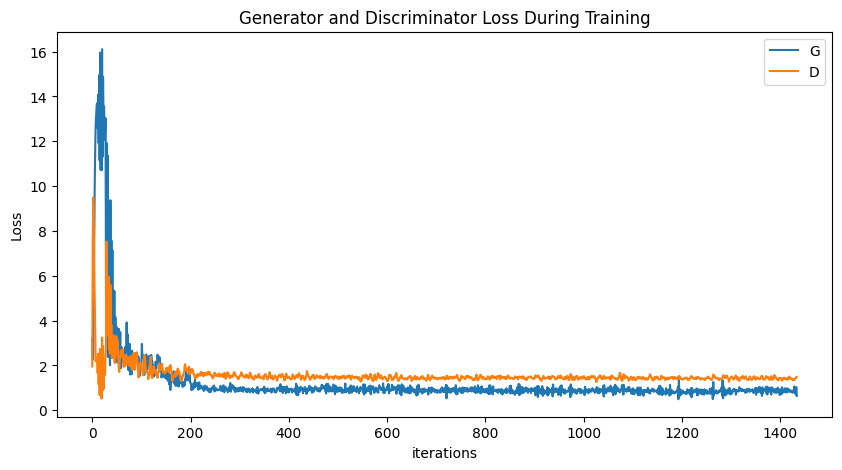

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

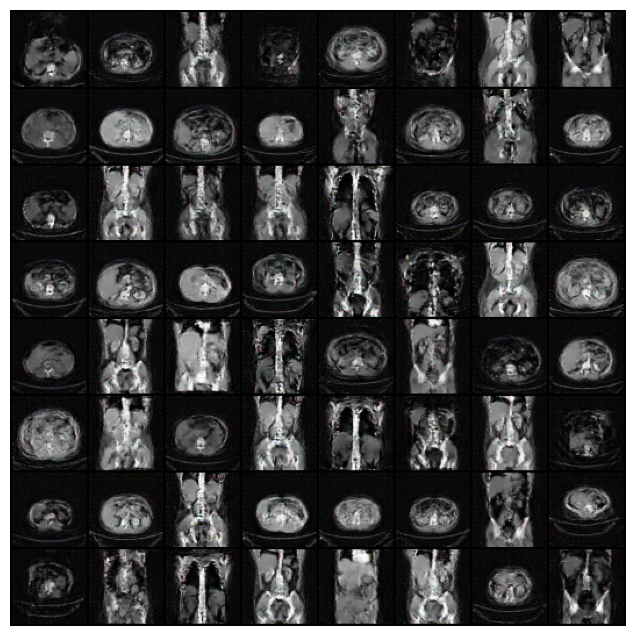

In [52]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/opt/conda/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


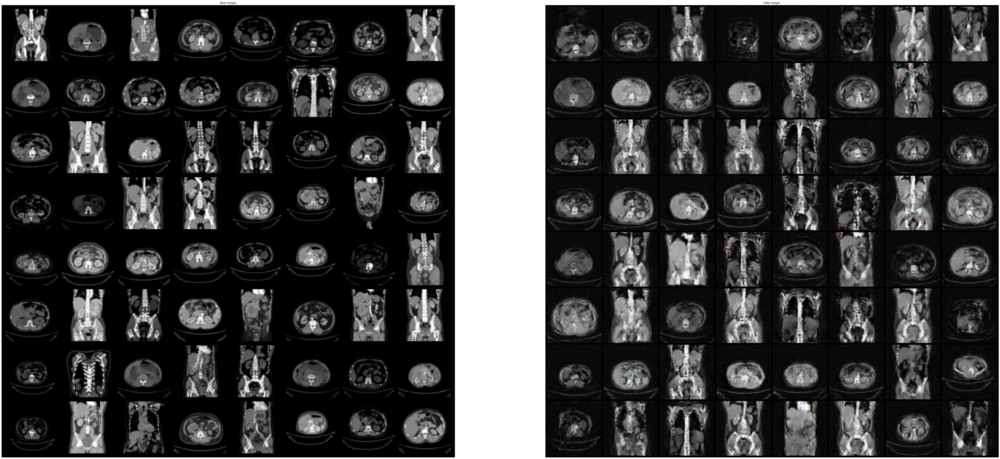

In [53]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(80,80))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()